In [1]:
import pandas as pd
import numpy as np
import pylab
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

In [14]:
#Overview of the data
df = pd.read_csv('hw5_treasury yield curve data.csv')
df.drop('Date',axis = 1,inplace = True)
df.head()

,SVENF01,SVENF02,SVENF03,SVENF04,SVENF05,SVENF06,SVENF07,SVENF08,SVENF09,SVENF10,...,SVENF22,SVENF23,SVENF24,SVENF25,SVENF26,SVENF27,SVENF28,SVENF29,SVENF30,Adj_Close
0,2.1224,2.0266,2.1023,2.2377,2.3790,2.5042,2.6069,2.6885,2.7530,2.8054,...,3.3355,3.3876,3.4400,3.4925,3.5446,3.5962,3.6471,3.6970,3.7458,10.130177
1,2.1239,2.0317,2.1096,2.2468,2.3901,2.5171,2.6217,2.7049,2.7710,2.8247,...,3.3574,3.4091,3.4610,3.5130,3.5646,3.6156,3.6660,3.7153,3.7636,10.130177
2,2.0874,1.9956,2.0844,2.2289,2.3736,2.4980,2.5984,2.6779,2.7418,2.7951,...,3.3589,3.4086,3.4575,3.5055,3.5524,3.5980,3.6421,3.6847,3.7257,10.150118
3,2.1319,2.0559,2.1451,2.2856,2.4257,2.5461,2.6428,2.7188,2.7791,2.8289,...,3.3940,3.4485,3.5029,3.5568,3.6099,3.6622,3.7132,3.7630,3.8113,10.130177
4,2.1051,2.0234,2.1180,2.2632,2.4051,2.5248,2.6198,2.6940,2.7532,2.8029,...,3.3712,3.4227,3.4735,3.5234,3.5722,3.6196,3.6655,3.7098,3.7525,10.130177


In [16]:
#data info and types, notice that there are missing values in the target variable 
df.info()
df.dtypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8635 entries, 0 to 8634
Data columns (total 31 columns):
SVENF01      8353 non-null float64
SVENF02      8353 non-null float64
SVENF03      8353 non-null float64
SVENF04      8353 non-null float64
SVENF05      8353 non-null float64
SVENF06      8353 non-null float64
SVENF07      8353 non-null float64
SVENF08      8353 non-null float64
SVENF09      8353 non-null float64
SVENF10      8353 non-null float64
SVENF11      8353 non-null float64
SVENF12      8353 non-null float64
SVENF13      8353 non-null float64
SVENF14      8353 non-null float64
SVENF15      8353 non-null float64
SVENF16      8353 non-null float64
SVENF17      8353 non-null float64
SVENF18      8353 non-null float64
SVENF19      8353 non-null float64
SVENF20      8353 non-null float64
SVENF21      8353 non-null float64
SVENF22      8353 non-null float64
SVENF23      8353 non-null float64
SVENF24      8353 non-null float64
SVENF25      8353 non-null float64
SVENF26      8353 

SVENF01      float64
SVENF02      float64
SVENF03      float64
SVENF04      float64
SVENF05      float64
SVENF06      float64
SVENF07      float64
SVENF08      float64
SVENF09      float64
SVENF10      float64
SVENF11      float64
SVENF12      float64
SVENF13      float64
SVENF14      float64
SVENF15      float64
SVENF16      float64
SVENF17      float64
SVENF18      float64
SVENF19      float64
SVENF20      float64
SVENF21      float64
SVENF22      float64
SVENF23      float64
SVENF24      float64
SVENF25      float64
SVENF26      float64
SVENF27      float64
SVENF28      float64
SVENF29      float64
SVENF30      float64
Adj_Close    float64
dtype: object

In [28]:
#Drop observations to match with the target variable
df.dropna(inplace = True)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8071 entries, 0 to 8070
Data columns (total 31 columns):
SVENF01      8071 non-null float64
SVENF02      8071 non-null float64
SVENF03      8071 non-null float64
SVENF04      8071 non-null float64
SVENF05      8071 non-null float64
SVENF06      8071 non-null float64
SVENF07      8071 non-null float64
SVENF08      8071 non-null float64
SVENF09      8071 non-null float64
SVENF10      8071 non-null float64
SVENF11      8071 non-null float64
SVENF12      8071 non-null float64
SVENF13      8071 non-null float64
SVENF14      8071 non-null float64
SVENF15      8071 non-null float64
SVENF16      8071 non-null float64
SVENF17      8071 non-null float64
SVENF18      8071 non-null float64
SVENF19      8071 non-null float64
SVENF20      8071 non-null float64
SVENF21      8071 non-null float64
SVENF22      8071 non-null float64
SVENF23      8071 non-null float64
SVENF24      8071 non-null float64
SVENF25      8071 non-null float64
SVENF26      8071 

In [31]:
print(df.shape)
df.describe()

(8071, 31)


,SVENF01,SVENF02,SVENF03,SVENF04,SVENF05,SVENF06,SVENF07,SVENF08,SVENF09,SVENF10,...,SVENF22,SVENF23,SVENF24,SVENF25,SVENF26,SVENF27,SVENF28,SVENF29,SVENF30,Adj_Close
count,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,...,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000,8071.000000
mean,3.785311,4.258972,4.669363,5.022430,5.318493,5.559644,5.750071,5.895135,6.000596,6.072112,...,5.689046,5.621666,5.554136,5.486943,5.420479,5.355063,5.290948,5.228333,5.167371,5.509793
std,2.648060,2.498137,2.341348,2.221632,2.137801,2.080405,2.040337,2.010786,1.987244,1.966960,...,1.801291,1.797858,1.797012,1.798842,1.803390,1.810643,1.820541,1.832984,1.847834,2.491110
min,0.072700,0.327300,0.630300,1.013000,1.424500,1.698200,1.807300,1.885000,1.942100,1.988200,...,1.489600,1.283000,1.100800,0.941000,0.801800,0.681200,0.577100,0.487600,0.411100,2.801050
25%,1.144050,1.865600,2.536550,3.023050,3.544700,4.063300,4.409750,4.644300,4.774550,4.859500,...,4.177450,4.090550,4.024800,3.982950,3.962100,3.887150,3.840900,3.825050,3.831350,3.130587
50%,3.986500,4.393300,4.505500,4.718900,5.051300,5.394600,5.663700,5.870800,5.993700,6.082400,...,5.619600,5.503000,5.369900,5.228000,5.096700,4.979700,4.860800,4.758600,4.669000,4.956219
75%,5.901500,6.221250,6.461300,6.626600,6.779550,6.908050,7.049900,7.181600,7.297550,7.393350,...,7.330550,7.233200,7.114900,6.998150,6.871050,6.765400,6.650600,6.535450,6.421850,8.051437
max,9.813800,9.887800,10.145600,10.459900,10.649900,10.741400,10.766300,10.747500,10.701500,10.640000,...,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.535100,10.150118


In [33]:
#Correlation matrix
corMat = pd.DataFrame(df.corr())
corMat

,SVENF01,SVENF02,SVENF03,SVENF04,SVENF05,SVENF06,SVENF07,SVENF08,SVENF09,SVENF10,...,SVENF22,SVENF23,SVENF24,SVENF25,SVENF26,SVENF27,SVENF28,SVENF29,SVENF30,Adj_Close
SVENF01,1.000000,0.986417,0.958364,0.924637,0.890691,0.860385,0.835864,0.817792,0.805833,0.799116,...,0.818245,0.813380,0.806650,0.798100,0.787826,0.775963,0.762679,0.748167,0.732632,-0.849562
SVENF02,0.986417,1.000000,0.991325,0.971026,0.945906,0.920994,0.899469,0.882818,0.871309,0.864483,...,0.880253,0.875325,0.868506,0.859830,0.849384,0.837300,0.823744,0.808910,0.793006,-0.884194
SVENF03,0.958364,0.991325,1.000000,0.993681,0.978891,0.960996,0.943810,0.929497,0.918916,0.912072,...,0.917414,0.912155,0.905080,0.896211,0.885620,0.873430,0.859797,0.844907,0.828962,-0.898952
SVENF04,0.924637,0.971026,0.993681,1.000000,0.995480,0.985206,0.973186,0.962005,0.952978,0.946523,...,0.935990,0.929804,0.921925,0.912369,0.901202,0.888536,0.874519,0.859327,0.843153,-0.903707
SVENF05,0.890691,0.945906,0.978891,0.995480,1.000000,0.996934,0.990180,0.982494,0.975478,0.969858,...,0.941744,0.934145,0.924980,0.914267,0.902072,0.888503,0.873704,0.857846,0.841114,-0.903779
SVENF06,0.860385,0.920994,0.960996,0.985206,0.996934,1.000000,0.998022,0.993749,0.988922,0.984458,...,0.940299,0.931069,0.920375,0.908243,0.894745,0.879994,0.864134,0.847334,0.829776,-0.902343
SVENF07,0.835864,0.899469,0.943810,0.973186,0.990180,0.998022,1.000000,0.998756,0.996054,0.992905,...,0.936188,0.925358,0.913126,0.899534,0.884664,0.868636,0.851601,0.833730,0.815205,-0.901242
SVENF08,0.817792,0.882818,0.929497,0.962005,0.982494,0.993749,0.998756,1.000000,0.999202,0.997388,...,0.932400,0.920175,0.906572,0.891646,0.875496,0.858251,0.840071,0.821133,0.801622,-0.901317
SVENF09,0.805833,0.871309,0.918916,0.952978,0.975478,0.988922,0.996054,0.999202,1.000000,0.999443,...,0.930524,0.917211,0.902507,0.886484,0.869255,0.850962,0.831773,0.811874,0.791457,-0.902706
SVENF10,0.799116,0.864483,0.912072,0.946523,0.969858,0.984458,0.992905,0.997388,0.999443,1.000000,...,0.931140,0.917093,0.901615,0.884793,0.866751,0.847646,0.827655,0.806972,0.785796,-0.905134


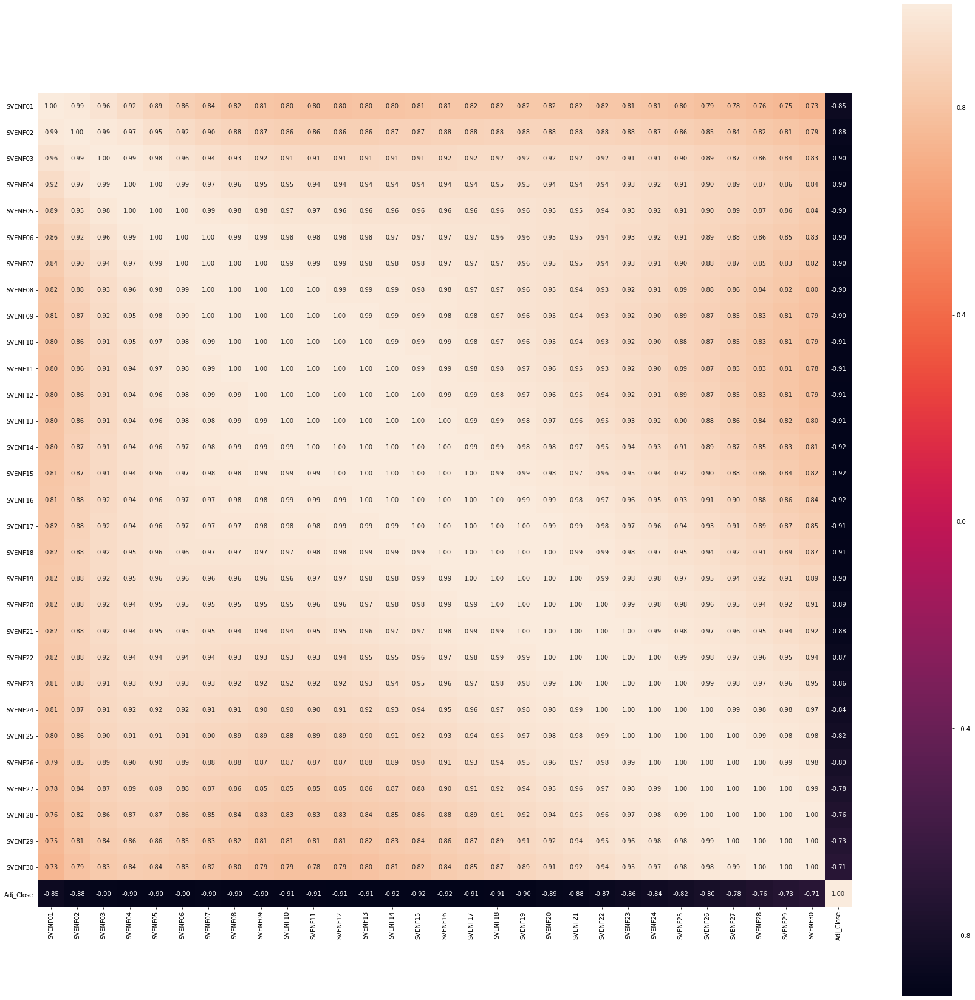

In [36]:
#Heatmap
plt.figure(figsize=(30,30))
hm = sns.heatmap(corMat,
cbar=True,
annot=True,
square=True,
fmt='.2f',
annot_kws={'size':10},
yticklabels=df.columns,
xticklabels=df.columns)
plt.show()

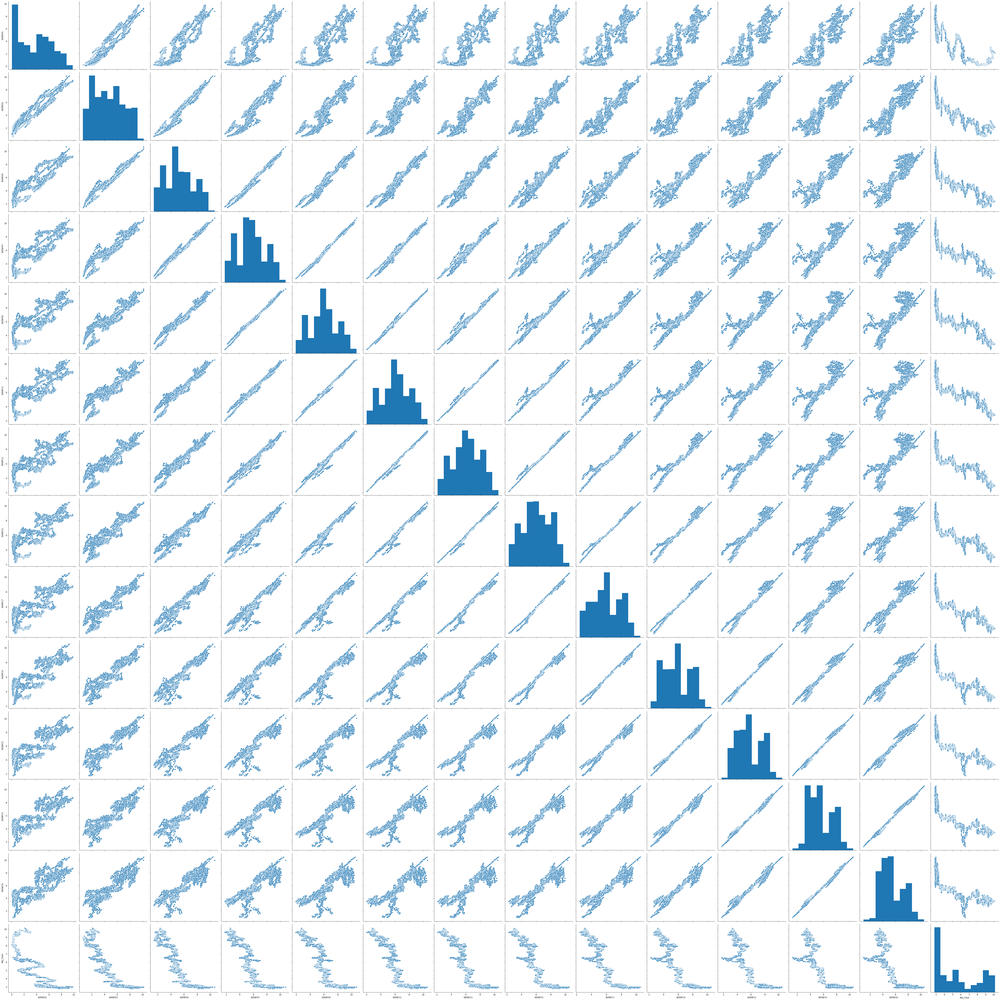

In [35]:
#Scatterplot matrix
import matplotlib.pyplot as plt
import seaborn as sns
cols= ['SVENF01','SVENF03','SVENF05','SVENF07','SVENF09','SVENF11','SVENF13','SVENF15','SVENF17','SVENF19','SVENF21','SVENF23','SVENF25','Adj_Close']
sns.pairplot(df[cols], height = 5)
plt.tight_layout()
plt.show()
#notice that most of the scatterplots represents certain level of linear correlation, which coincide with the heatmap above.

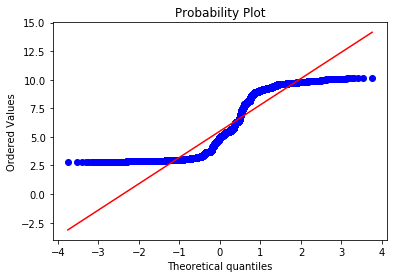

In [39]:
# Q-Q Plot
from scipy import stats
stats.probplot(df.Adj_Close, dist="norm", plot=plt)
plt.show()

In [106]:
import sklearn
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
X=df[df.columns[:-1]].values
y=df['Adj_Close'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
y_train=y_train.reshape(-1,1)
y_test=y_test.reshape(-1,1)

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
mms = MinMaxScaler()
scaler = preprocessing.StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
y_train = mms.fit_transform(y_train)
y_test = mms.transform(y_test)


In [107]:
print('Shape of X_train: ', X_train.shape)
print('Shape of y_train: ', y_train.shape)
print('Shape of X_test: ', X_test.shape)
print('Shape of y_test: ', y_test.shape)

Shape of X_train:  (6860, 30)
Shape of y_train:  (6860, 1)
Shape of X_test:  (1211, 30)
Shape of y_test:  (1211, 1)


In [108]:
#Linear Regression, info containing MSE & R^2
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

slr = LinearRegression()
slr.fit(X_train,y_train)
start= time.clock()

print('coefficient: ', slr.coef_)
print('intercept: ', slr.intercept_)
print('R2 training: ', slr.score(X_train, y_train))
print('RMSE training: ', np.sqrt(mean_squared_error(slr.predict(X_train), y_train)))
print('R2 testing : ', slr.score(X_test, y_test))
print('RMSE testing : ', np.sqrt(mean_squared_error(slr.predict(X_test), y_test)))
end = time.clock()
print("Run time", end - start,'s')

coefficient:  [[  -1.74209314   18.05601776  -79.50362437  178.28689279 -199.58179055
    64.47665974   80.18558906  -82.65661605  -11.96186441   85.67966428
   -76.32217112   52.50255604   -0.23207591  -22.41199213  -24.70499289
    -1.90320888  -76.1229696    54.10702262   34.00038232   33.014706
   138.49961127  -95.08318818   43.1476239  -102.49449768 -195.04972914
    58.72040574   25.36791629  208.50203185  -20.1023629   -84.92582726]]
intercept:  [0.36699988]
R2 training:  0.9022730353400444
RMSE training:  0.10568051677260075
R2 testing :  0.9041309535337716
RMSE testing :  0.10645834077267638
Run time 0.011953900000662543 s


C:\Users\Alex_\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  
C:\Users\Alex_\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  app.launch_new_instance()


In [109]:
# Support Vector Regression (using all features of the initial data)
from sklearn.svm import SVR

svr = SVR(kernel='rbf')

svr.fit(X_train,y_train)
start= time.clock()

print('intercept: ', svr.intercept_)
print('R2 training: ', svr.score(X_train, y_train))
print('RMSE training: ', np.sqrt(mean_squared_error(svr.predict(X_train), y_train)))
print('R2 testing : ', svr.score(X_test, y_test))
print('RMSE testing : ', np.sqrt(mean_squared_error(svr.predict(X_test), y_test)))
end = time.clock()
print("Run time", end - start,'s')

C:\Users\Alex_\Anaconda3\lib\site-packages\sklearn\utils\validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Alex_\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  import sys


intercept:  [0.46107123]
R2 training:  0.9801625228846407
RMSE training:  0.04761359161360448
R2 testing :  0.9815563011489163
RMSE testing :  0.04669436786503233
Run time 0.13985820000016247 s


C:\Users\Alex_\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  


In [111]:
#Explained variance ratio for all components
from sklearn.decomposition import PCA
pca_before = PCA()
pca_before.fit(X)
print('Explained variance ratio: ', pca_before.explained_variance_ratio_)

Explained variance ratio:  [9.25027254e-01 3.77198563e-02 3.11962115e-02 5.11829721e-03
 8.45006479e-04 8.14071111e-05 1.06386900e-05 1.23073879e-06
 8.99497477e-08 7.14094977e-09 4.89071592e-10 3.83422436e-11
 8.63162713e-12 7.54060102e-12 7.44722038e-12 7.41409677e-12
 7.37633844e-12 7.36922042e-12 7.21033060e-12 7.16011018e-12
 7.08499808e-12 7.01615861e-12 6.97953948e-12 6.83297854e-12
 6.78790385e-12 6.76011093e-12 6.68796631e-12 6.63106214e-12
 6.57322725e-12 6.42225375e-12]


In [112]:
# Explained variance ratio when n_components = 3
pca_after = PCA(n_components=3)
pca_after.fit(X)
print('Explained variance ratio when n_components = 3: ', pca_after.explained_variance_ratio_)
print('Explained variance when n_components = 3: ', pca_after.explained_variance_)

Explained variance ratio when n_components = 3:  [0.92502725 0.03771986 0.03119621]
Explained variance when n_components = 3:  [107.90283548   4.39995625   3.63898432]


In [113]:
#Apply PCA method and transform the data 
import sklearn
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
X=df[df.columns[:-1]].values
y=df['Adj_Close'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
y_train=y_train.reshape(-1,1)
y_test=y_test.reshape(-1,1)

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
mms = MinMaxScaler()
scaler = preprocessing.StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
y_train = mms.fit_transform(y_train)
y_test = mms.transform(y_test)
X_train_pca = pca_after.fit_transform(X_train)
X_test_pca= pca_after.fit_transform(X_test)

print('Shape of X_train_pca: ', X_train_pca.shape)
print('Shape of y_train_pca: ', y_train_pca.shape)
print('Shape of X_test_pca: ', X_test_pca.shape)
print('Shape of y_test_pca: ', y_test_pca.shape)

Shape of X_train_pca:  (6860, 3)
Shape of y_train_pca:  (6860,)
Shape of X_test_pca:  (1211, 3)
Shape of y_test_pca:  (1211,)


In [116]:
# Linear Regression（n_components = 3）
slr = LinearRegression()
slr.fit(X_train_pca,y_train_pca)
start= time.clock()

print('coefficient: ', slr.coef_)
print('intercept: ', slr.intercept_)
print('R2 training: ', slr.score(X_train_pca, y_train_pca))
print('RMSE training: ', np.sqrt(mean_squared_error(slr.predict(X_train_pca), y_train_pca)))
print('R2 testing : ', slr.score(X_test_pca, y_test_pca))
print('RMSE testing : ', np.sqrt(mean_squared_error(slr.predict(X_test_pca), y_test_pca)))
end = time.clock()
print("Run time", end - start,'s')

coefficient:  [-0.42364406 -0.48646442  0.26559618]
intercept:  5.4981571043731785
R2 training:  0.8672181160186359
RMSE training:  0.9052935003366369
R2 testing :  0.8636574057368397
RMSE testing :  0.9330147976343554
Run time 0.011051799996494083 s


C:\Users\Alex_\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  after removing the cwd from sys.path.
C:\Users\Alex_\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  if sys.path[0] == '':


In [115]:
# Support Vector Regression (n_components = 3)
svr = SVR(kernel='rbf')

svr.fit(X_train_pca,y_train_pca)
start= time.clock()

print('intercept: ', svr.intercept_)
print('R2 training: ', svr.score(X_train_pca, y_train_pca))
print('RMSE training: ', np.sqrt(mean_squared_error(svr.predict(X_train_pca), y_train_pca)))
print('R2 testing : ', svr.score(X_test_pca, y_test_pca))
print('RMSE testing : ', np.sqrt(mean_squared_error(svr.predict(X_test_pca), y_test_pca)))
end = time.clock()
print("Run time", end - start,'s')

C:\Users\Alex_\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
C:\Users\Alex_\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  """


intercept:  [5.16287552]
R2 training:  0.9900739080853601
RMSE training:  0.2475193382934348
R2 testing :  0.9880248199717423
RMSE testing :  0.27651187085248213
Run time 0.9911492999999609 s


C:\Users\Alex_\Anaconda3\lib\site-packages\ipykernel_launcher.py:12: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  if sys.path[0] == '':


In [100]:
print("My name is Zihan Yu")
print("My NetID is: zihanyu3")
print("I hereby certify that I have read the University policy on Academic Integrity and that I am not in violation.")

My name is Zihan Yu
My NetID is: zihanyu3
I hereby certify that I have read the University policy on Academic Integrity and that I am not in violation.
